# Обучение семантической сегментации UNET
## Сегментация дорог на спутниковых снимках, обученная на датасете massachusetts-roads-dataset
Классы: road, backgroud
Изображения в формате tiff, сегментационная разметка в формате tif.

Исходно: картинка ргб, 1500х1500х3, маска 1500х1500х1 (0 255).
Переводим 1 канальную маску в инхот: 1500х1500х3, маска 1500х1500х2 (классы фон и дорога 0 и 1). 
После предсказания получаем: двухканальную маску? переводим с помощью визуализации в 3 канальную ргб. 

In [1]:
!pip install segmentation_models_pytorch albumentations

import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from glob import glob
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

import torch
import random
import segmentation_models_pytorch as smp
from segmentation_models_pytorch import utils
import albumentations as albu

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
random.seed(seed)
np.random.seed(seed)
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 29.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found existing installation: nvidia-curand-cu12 10.3.10.19
    Uninstalling nvidia-curand-cu12-1

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


### Изучаем датасет (смотрим изображение и маску)

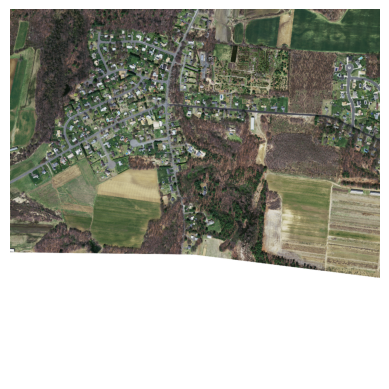

Mask shape: (1500, 1500)
Unique values: [  0 255]


In [2]:
from PIL import Image
import matplotlib.pyplot as plt

#посмотрим, как выглядит изображение
example_path = "/kaggle/input/massachusetts-roads-dataset/tiff/train/10078660_15.tiff"
img = Image.open(example_path)
plt.imshow(img)
plt.axis("off")
plt.show()

#Размеры и обозначения маски
mask = np.array(Image.open("/kaggle/input/massachusetts-roads-dataset/tiff/test_labels/10378780_15.tif"))
print("Mask shape:", mask.shape)
print("Unique values:", np.unique(mask))

###здесь одноканальная маска (черно белая) с индексами классов 0 и 255 (0-фон, 255-дорога)

#### Задаем пути константы:

In [3]:
DATASET_NAME = "/kaggle/input/massachusetts-roads-dataset/tiff"

X_TRAIN_DIR = f"{DATASET_NAME}/train"
Y_TRAIN_DIR = f"{DATASET_NAME}/train_labels"

X_VAL_DIR = f"{DATASET_NAME}/val"
Y_VAL_DIR = f"{DATASET_NAME}/val_labels"

X_TEST_DIR = f"{DATASET_NAME}/test"
Y_TEST_DIR = f"{DATASET_NAME}/test_labels"

LABELS_COLOR_FILE = "/kaggle/input/massachusetts-roads-dataset/label_class_dict.csv"


CLASSES = [
    'background',
    'road'
]

ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid' 
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

EPOCHS =40
BATCH_SIZE = 16
INIT_LR = 0.00008
LR_DECREASE_STEP = 15
LR_DECREASE_COEF = 2 #lr будет разделен на этот коэффициент раз в LR_DECREASE_STEP эпох

INFER_WIDTH = 512
INFER_HEIGHT = 512

#loss = smp.losses.DiceLoss(mode='multiclass')
loss = utils.losses.DiceLoss()


### Вспомогательные функции для отображения картинок

In [4]:
def _convert_multichannel2singlechannel(input_mask: np.ndarray, raw):
    """ Осуществляет перевод двухканальной маски (число каналов сколько классов) в трехканальное 
    изображение где будет расцветка как зададим в словаре colors_imshow для классов """

    colors_imshow = {
        "background" : np.array([0, 0, 0]),
        "road" : np.array([255, 255, 255])
        }
    
    if not raw:
        input_mask = input_mask.transpose(2, 0, 1)
    output_mask = np.zeros((input_mask.shape[1], input_mask.shape[2], 3), dtype=np.uint8)
    square_ratios = {}
    #print('input_mask.shape', input_mask.shape)

    for i, singlechannel_mask in enumerate(input_mask):
        
        cls = CLASSES[i]
        singlechannel_mask = singlechannel_mask.squeeze()
        #print('singlechannel_mask.shape', singlechannel_mask.shape)

        # Заодно осуществляет подсчет процента каждого класса (сумма пикселей на общее число)
        square_ratios[cls] = singlechannel_mask.sum() / singlechannel_mask.size
        output_mask += np.multiply.outer(singlechannel_mask > 0, colors_imshow[cls]).astype(np.uint8)
        

    title = "Площади: " + "\n".join([f"{cls}: {square_ratios[cls]*100:.1f}%" for cls in CLASSES])
    
    return output_mask, title


def visualize_multichennel_mask(img: np.ndarray, multichennel_mask: np.ndarray, raw=False):
    """Демонстрации маски и самого изображения. Подаем ohe маску"""
    #размер маска (H, W, CHANNEL)
    _, axes = plt.subplots(1, 2, figsize=(10,5))
    axes[0].imshow(img)
    
    #Преобразуем мультиканальную или одноканальную маску в цветную маску
    mask_to_show, title = _convert_multichannel2singlechannel(multichennel_mask, raw=raw)

    axes[1].imshow(mask_to_show)
    axes[1].set_title(title)

    plt.tight_layout()
    plt.show()

### Делаем ohe кодировку маски, чтобы была двухканальная маска для двух классов (а не бинарная).

In [5]:
def ohe_mask(mask: np.array):
    classes = np.unique(mask)
    num_classes = classes.shape[-1]
    ohe_mask = np.zeros((np.unique(mask).shape[-1], mask.shape[0], mask.shape[1]))

    for i, cls in enumerate(classes):
        ohe_mask[i] = (mask == cls)

    return ohe_mask

### Визуализируем изображения, проверяем работу функции
(здесь неверный подсчет площади, так как функция работает с номерами классов 0 и 1, а не 0 и 255, и нужно дополнительно делить на ноль)

In [6]:
img = Image.open("/kaggle/input/massachusetts-roads-dataset/tiff/test/10378780_15.tiff")
img_np = np.array(img)
print(f"img_np.shape {img_np.shape}")

mask = Image.open("/kaggle/input/massachusetts-roads-dataset/tiff/test_labels/10378780_15.tif")
mask_np = np.array(mask)
print(f"mask_np.shape {mask_np.shape}")

mask_np = ohe_mask(np.array(mask))
print(mask_np.shape)


img_np.shape (1500, 1500, 3)
mask_np.shape (1500, 1500)
(2, 1500, 1500)


(1500, 1500, 3) (2, 1500, 1500)


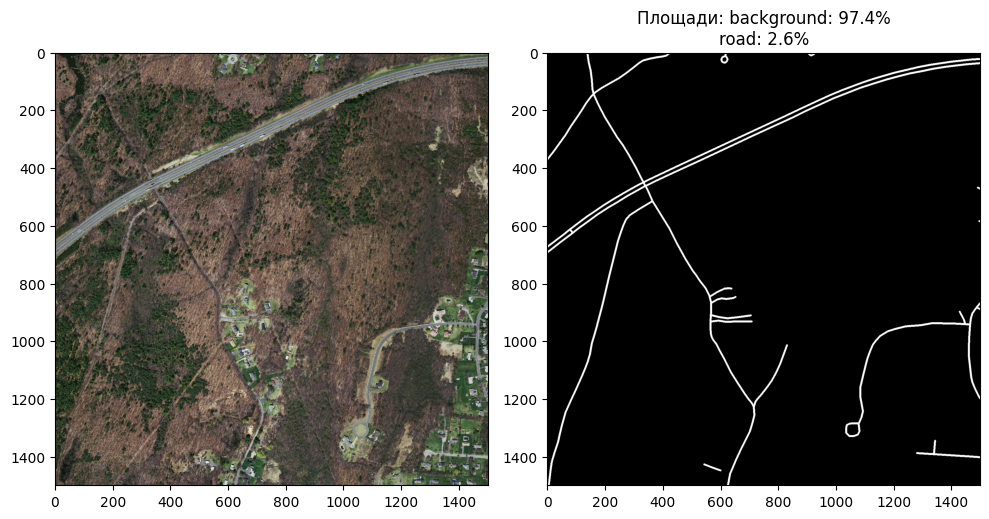

In [7]:
img = Image.open("/kaggle/input/massachusetts-roads-dataset/tiff/test/10378780_15.tiff")
img_np = np.array(img)
mask = Image.open("/kaggle/input/massachusetts-roads-dataset/tiff/test_labels/10378780_15.tif")
mask_np = ohe_mask(np.array(mask))
print(img_np.shape, mask_np.shape)
visualize_multichennel_mask(img_np, mask_np, raw=True)

### Dataloader

In [8]:
from PIL import Image
import numpy as np
from pathlib import Path


class Dataset(BaseDataset):
    def __init__(
        self, 
        images_dir, 
        masks_dir,
        augmentation=None, 
        preprocessing=None
    ):

        self.image_paths = sorted(glob(f"{images_dir}/*.tiff"))
        self.mask_paths = sorted(glob(f"{masks_dir}/*.tif"))
        self.cls_colors = self._get_classes_colors(LABELS_COLOR_FILE)
        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def _get_classes_colors(self, labels_colors_dir):
        """Достает цвета классов из файла с классами.
           Переносит их в словарь, сортируя в том же порядке, как заданно выше.
           Проверяет наличие всех классов в файле, согласно заданным выше
        """
        cls_colors = {}
        with open(labels_colors_dir) as file:
            while line := file.readline():
                #print(line.rstrip().split(','))
                label, R, G, B = line.rstrip().split(',')
                if label != 'name':
                    #print(R, G, B, label)
                    cls_colors[label] = np.array([B, G, R], dtype=np.uint8)
        #print(cls_colors)

        keyorder = CLASSES
        cls_colors_ordered = {}
        for k in keyorder:
            if k in cls_colors:
                cls_colors_ordered[k] = cls_colors[k]
            elif k=="background":
                cls_colors_ordered[k] = np.array([0, 0, 0], dtype=np.uint8)
            else:
                raise ValueError(f"Unexpected label {k}, cls colors {cls_colors}")
        return cls_colors_ordered

    def __getitem__(self, i):
        #image = cv2.imread(self.image_paths[i])
        image = Image.open(self.image_paths[i])
        image = np.array(image)
        mask = Image.open(self.mask_paths[i])
        mask = np.array(mask)
        #print(np.unique(mask_np))
        mask = (mask == 255).astype(np.uint8)  # road = 1, background = 0
        mask = ohe_mask(mask)
        #masks = [cv2.inRange(mask, color, color) for color in self.cls_colors.values()]
        #masks = [(m > 0).astype("float32") for m in masks]
        #mask = np.stack(masks, axis=-1).astype("long")
        mask = mask.transpose(1, 2, 0)  # → (C, H, W)

        #apply augmentation
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample["image"], sample["mask"]
    
        #apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample["image"], sample["mask"]
        return image, mask
    
    def __len__(self):
        return len(self.image_paths)

860
(1500, 1500, 3) (1500, 1500, 2)


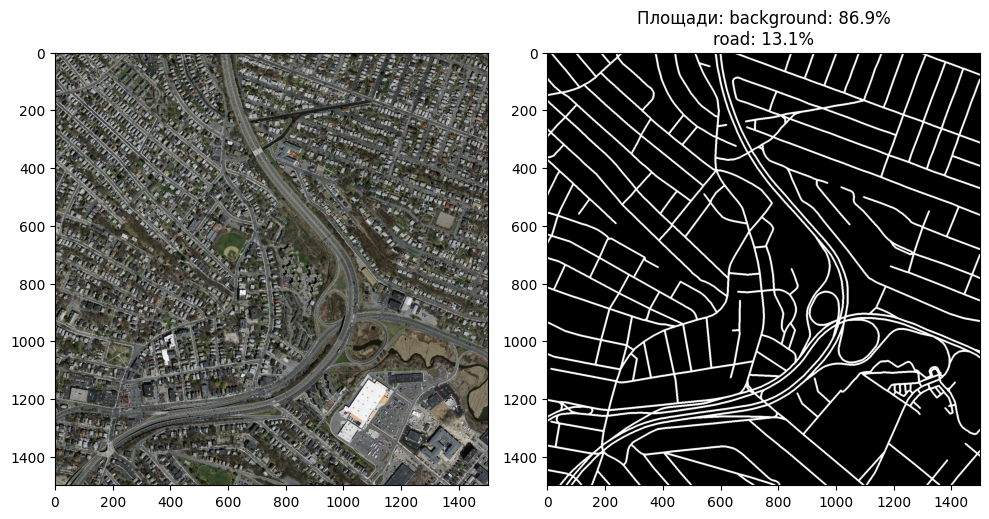

In [9]:
dataset = Dataset(X_TRAIN_DIR, Y_TRAIN_DIR)
i = np.random.randint(len(dataset))
print(i)
image, mask = dataset[i]
print(image.shape, mask.shape)
visualize_multichennel_mask(image, mask)

In [10]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Пример: загрузка маски
mask = cv2.imread("/kaggle/input/massachusetts-roads-dataset/tiff/test_labels/10378780_15.tif")  # OpenCV читает в BGR!
unique_colors = np.unique(mask.reshape(-1, 3), axis=0)

print(dataset.cls_colors)
# {'background': array([0, 0, 0]), 'road': array([0, 0, 255])}

{'background': array([0, 0, 0], dtype=uint8), 'road': array([255, 255, 255], dtype=uint8)}


## Augmentations

In [11]:
def get_training_augmentation():
    train_transform = [

        albu.HorizontalFlip(p=0.5),
        albu.LongestMaxSize(max_size=INFER_HEIGHT, always_apply=True),
        albu.PadIfNeeded(min_height=int(INFER_HEIGHT*1.1), min_width=int(INFER_WIDTH*1.1),
                        border_mode=2, always_apply=True, interpolation=cv2.INTER_NEAREST),
        #рандомное обрезание ровно по размеру для подачи на нейронную сеть 
        albu.CenterCrop(height=INFER_HEIGHT, width=INFER_WIDTH, always_apply=True)

        #albu.OneOf(
        #    [
        #        albu.Sharpen(alpha=(0.1, 0.2), lightness=(0.1, 0.2), p=0.5),
        #        albu.Blur(blur_limit=[1, 3], p=0.5),
        #        albu.GaussNoise(var_limit=(1, 5), p=0.5),
        #    ],
        #    p=0.7, #уменьшение вероятности применения любой агументации
        #),
        
        #albu.OneOf(
        #    [
        #        albu.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5),
        #        albu.HueSaturationValue(hue_shift_limit=5, sat_shift_limit=10, val_shift_limit=5, p=0.5),
        #        albu.RGBShift(r_shift_limit=10, g_shift_limit=10, b_shift_limit=10, p=0.5)
        #    ],
        #    p=0.7
        #),
    ]
    return albu.Compose(train_transform)


def get_validation_augmentation():
    test_transform = [albu.LongestMaxSize(max_size=INFER_HEIGHT, always_apply=True),
    albu.PadIfNeeded(min_height=INFER_HEIGHT, min_width=INFER_WIDTH, border_mode=2, always_apply=True, interpolation=cv2.INTER_NEAREST),
    albu.CenterCrop(height=INFER_HEIGHT, width=INFER_WIDTH, always_apply=True)               
    ]
    return albu.Compose(test_transform)


def to_tensor(x, **kwargs):
    #if x.ndim == 2:  # маска (H, W)
    #    x = np.expand_dims(x, axis=0)  # → (1, H, W)
    #elif x.ndim == 3:  # изображение (H, W, C)
    #    x = x.transpose(2, 0, 1)  # → (C, H, W)
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn):
    #осуществит стартовую нормализацию данных согласно своим значениям или готовым для imagenet
    """Contruct preprocessing transform
    
    Args:
        preprocessing_fn(callbale): data normalixation function
         (can be specific for each pretrained nn).
    Return:
        transform: albumentation.Compose
    """
    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

### Пример аугментаций на трейне

(1500, 1500, 3) (1500, 1500, 2)


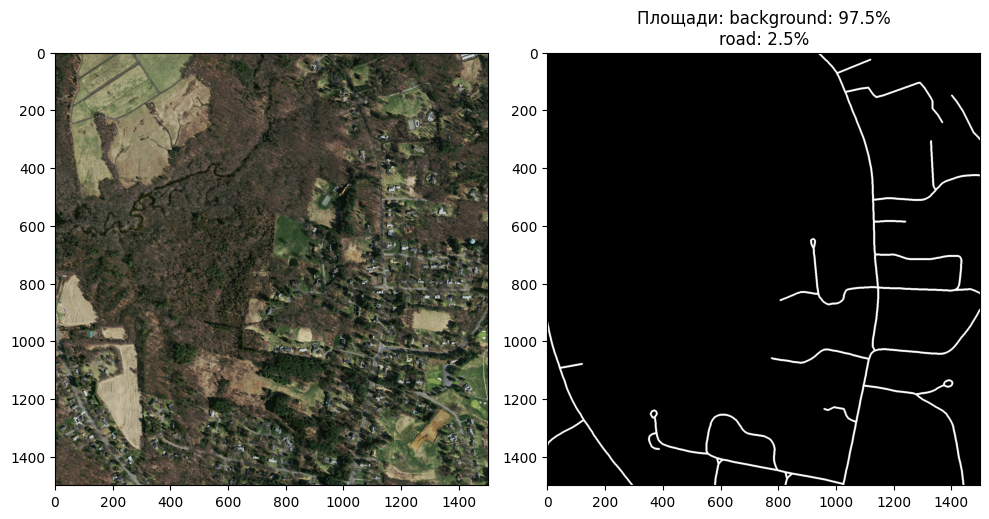

In [12]:
image, mask = dataset[100]
print(image.shape, mask.shape)
visualize_multichennel_mask(image, mask)

#### augmented_dataset = Dataset(
    X_TRAIN_DIR,
    Y_TRAIN_DIR,
    augmentation=get_training_augmentation()
)

#одно и то же изображение с агументациями и без
indx = np.random.randint(len(augmented_dataset))

for i in range(3):
    print(indx)
    image, mask = augmented_dataset[indx]
    visualize_multichennel_mask(image, mask)

### Пример аугментаций на тесте (они проще и ближе к продакшену)

/tmp/ipykernel_19/2013982689.py:33: UserWarning: Argument(s) 'always_apply' are not valid for transform MaxSizeTransform
  test_transform = [albu.LongestMaxSize(max_size=INFER_HEIGHT, always_apply=True),
/tmp/ipykernel_19/2013982689.py:34: UserWarning: Argument(s) 'always_apply, interpolation' are not valid for transform PadIfNeeded
  albu.PadIfNeeded(min_height=INFER_HEIGHT, min_width=INFER_WIDTH, border_mode=2, always_apply=True, interpolation=cv2.INTER_NEAREST),
/tmp/ipykernel_19/2013982689.py:35: UserWarning: Argument(s) 'always_apply' are not valid for transform CenterCrop
  albu.CenterCrop(height=INFER_HEIGHT, width=INFER_WIDTH, always_apply=True)


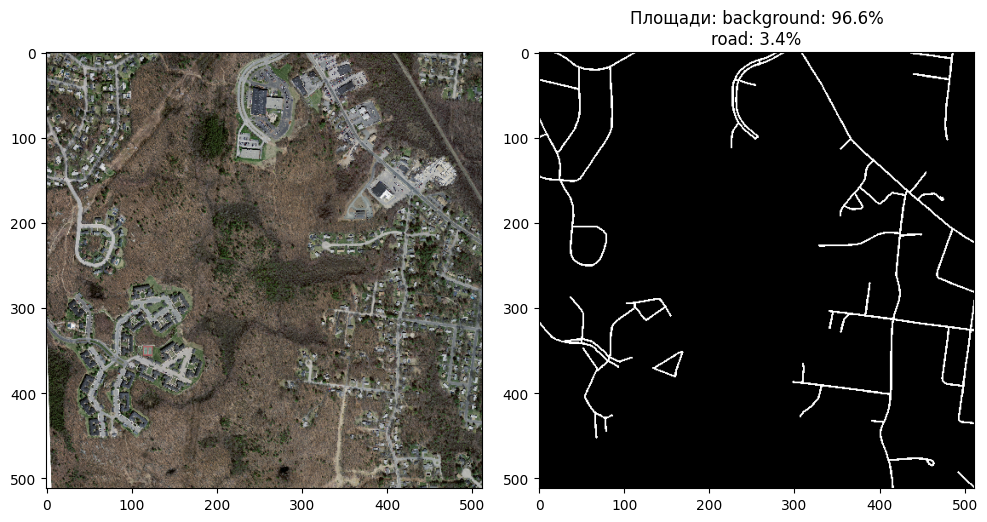

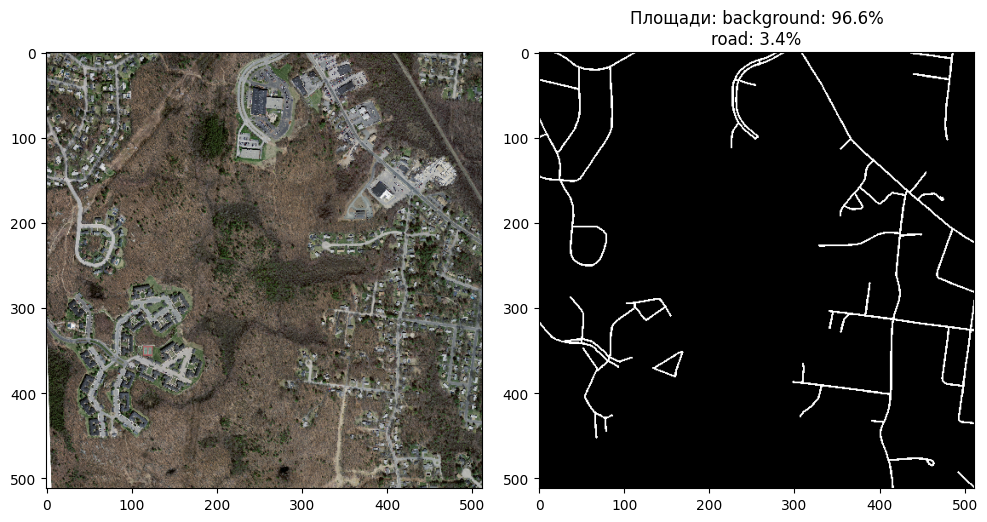

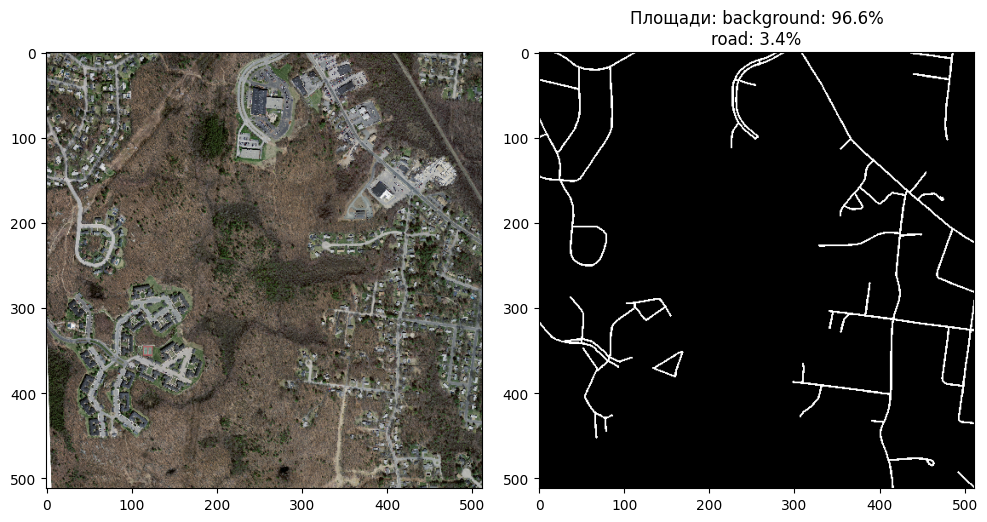

In [13]:
augmented_dataset = Dataset(
    X_VAL_DIR,
    Y_VAL_DIR,
    augmentation=get_validation_augmentation()
)

#одно и то же изображение с агументациями и без
indx = np.random.randint(len(augmented_dataset))

for i in range(3):
    image, mask = augmented_dataset[indx]
    visualize_multichennel_mask(image, mask)


# Создаем модель и обучаем

### Загружаем предобученную модель Unet

In [14]:
model = smp.Unet(
    encoder_name=ENCODER, #энкодер мы задач резнет
    encoder_weights=ENCODER_WEIGHTS, #веса мы задали pretrained для imagenet
    classes=len(CLASSES),
    activation=ACTIVATION #активацию делаем
)

config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

### Загружаем нормализацию (от imagenet)

In [15]:
preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

#есть вариант кастомного препроцессинга, например:
#preprocessing_fn = lambda img, **kwargs: img.astype("float32")/255
#это классическая нормализация, деление на 255, чтобы все было в диапазоне от 0 до 1

### Создаем датасеты и даталоадеры

In [16]:
train_dataset = Dataset(
    X_TRAIN_DIR,
    Y_TRAIN_DIR, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn)
)

val_dataset = Dataset(
    X_VAL_DIR,
    Y_VAL_DIR,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn)
)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=2 , shuffle=False)

/tmp/ipykernel_19/2013982689.py:5: UserWarning: Argument(s) 'always_apply' are not valid for transform MaxSizeTransform
  albu.LongestMaxSize(max_size=INFER_HEIGHT, always_apply=True),
/tmp/ipykernel_19/2013982689.py:6: UserWarning: Argument(s) 'always_apply, interpolation' are not valid for transform PadIfNeeded
  albu.PadIfNeeded(min_height=int(INFER_HEIGHT*1.1), min_width=int(INFER_WIDTH*1.1),
/tmp/ipykernel_19/2013982689.py:9: UserWarning: Argument(s) 'always_apply' are not valid for transform CenterCrop
  albu.CenterCrop(height=INFER_HEIGHT, width=INFER_WIDTH, always_apply=True)
/tmp/ipykernel_19/2013982689.py:33: UserWarning: Argument(s) 'always_apply' are not valid for transform MaxSizeTransform
  test_transform = [albu.LongestMaxSize(max_size=INFER_HEIGHT, always_apply=True),
/tmp/ipykernel_19/2013982689.py:34: UserWarning: Argument(s) 'always_apply, interpolation' are not valid for transform PadIfNeeded
  albu.PadIfNeeded(min_height=INFER_HEIGHT, min_width=INFER_WIDTH, border_

In [17]:
for image, mask in train_dataloader:
    print("Image shape:", image.shape)   # Должно быть: (B, 3, H, W)
    print("Mask shape:", mask.shape)     # Должно быть: (B, 1, H, W)
    print("Mask unique values:", torch.unique(mask))  # Должно быть что-то вроде: tensor([0., 1.])
    break



Image shape: torch.Size([16, 3, 512, 512])
Mask shape: torch.Size([16, 2, 512, 512])
Mask unique values: tensor([0., 1.])


In [18]:
metrics = [
    utils.metrics.Fscore(),
    utils.metrics.IoU(threshold=0.5) 
]

optimizer = torch.optim.Adam([
    dict(params = model.parameters(), lr=INIT_LR)])

In [19]:
#создаем epoch runner
train_epoch = utils.train.TrainEpoch(
    model, 
    loss=loss,
    metrics=metrics,
    optimizer=optimizer,
    device=DEVICE,
    verbose=True #выводим логи
)

val_epoch = utils.train.ValidEpoch(
    model,
    metrics=metrics,
    loss=loss,
    device=DEVICE,
    verbose=True
    
)

### Обучение

In [20]:
model_folder_path = "/kaggle/working/models"
if not os.path.exists(model_folder_path):
    os.makedirs(model_folder_path)

max_score = 0

loss_logs = {"train": [], "val": []}
metric_logs = {"train": [], "val": []}
for i in range(0, EPOCHS):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_dataloader)
    train_loss, train_metric, train_metric_IOU = list(train_logs.values())
    loss_logs["train"].append(train_loss)
    metric_logs["train"].append(train_metric_IOU)

    valid_logs = val_epoch.run(val_dataloader)
    val_loss, val_metric, val_metric_IOU = list(valid_logs.values())
    loss_logs["val"].append(val_loss)
    metric_logs["val"].append(val_metric_IOU)
    
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model, 'models/best_model_new.pth')
        # Save the model with JIT
        # Create a tensor with the specified dimensions
        trace_image = torch.randn(BATCH_SIZE, 3, INFER_HEIGHT, INFER_WIDTH)
        # Trace the model using the example input
        traced_model = torch.jit.trace(model, trace_image.to(DEVICE))
        torch.jit.save(traced_model, 'models/best_model_new.pt')
        print('Model saved!')

    print("LR:", optimizer.param_groups[0]['lr'])
    if i > 0 and i % LR_DECREASE_STEP == 0:
        print('Decrease decoder learning rate')
        optimizer.param_groups[0]['lr'] /= LR_DECREASE_COEF


Epoch: 0
valid: 100%|██████████| 7/7 [00:04<00:00,  1.72it/s, dice_loss - 0.328, fscore - 0.9242, iou_score - 0.8599]
Model saved!
LR: 8e-05

Epoch: 1
valid: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s, dice_loss - 0.2742, fscore - 0.9308, iou_score - 0.8712]
Model saved!
LR: 8e-05

Epoch: 2
valid: 100%|██████████| 7/7 [00:02<00:00,  2.72it/s, dice_loss - 0.2274, fscore - 0.9317, iou_score - 0.8728]
Model saved!
LR: 8e-05

Epoch: 3
valid: 100%|██████████| 7/7 [00:02<00:00,  2.78it/s, dice_loss - 0.1885, fscore - 0.9312, iou_score - 0.8719]
LR: 8e-05

Epoch: 4
valid: 100%|██████████| 7/7 [00:02<00:00,  2.80it/s, dice_loss - 0.1591, fscore - 0.9311, iou_score - 0.8718]
LR: 8e-05

Epoch: 5
valid: 100%|██████████| 7/7 [00:02<00:00,  2.73it/s, dice_loss - 0.1433, fscore - 0.9313, iou_score - 0.8722]
LR: 8e-05

Epoch: 6
valid: 100%|██████████| 7/7 [00:02<00:00,  2.79it/s, dice_loss - 0.125, fscore - 0.9326, iou_score - 0.8743]
Model saved!
LR: 8e-05

Epoch: 7
valid: 100%|██████████| 7/7 [0

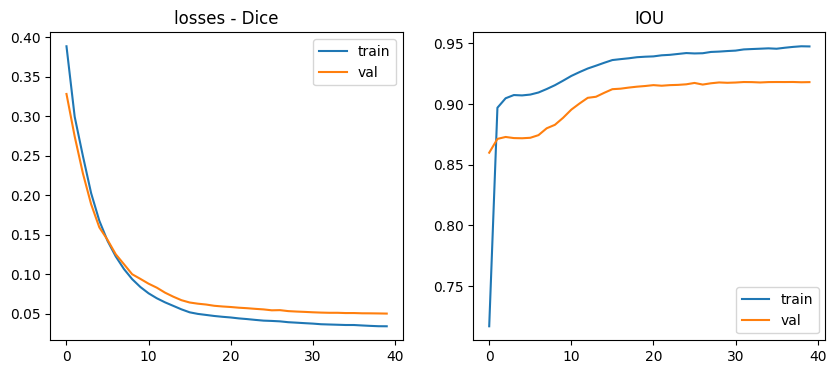

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))

axes[0].plot(loss_logs['train'], label='train')
axes[0].plot(loss_logs['val'], label='val')
axes[0].set_title("losses - Dice")

axes[1].plot(metric_logs['train'], label='train')
axes[1].plot(metric_logs['val'], label='val')
axes[1].set_title("IOU")

[ax.legend() for ax in axes]

## Tecтируем лучшую сохраненную модель

In [22]:
#загружаем лучшую сохраненную модель
#best_model = torch.load(model/best_model_new.pth) #стандартаня загрузка весов
best_model = torch.jit.load('models/best_model_new.pt', map_location=DEVICE) #загрузка через jit

In [23]:
#оцениваем модель на тесте iou
test_dataset = Dataset(
    X_TEST_DIR,
    Y_TEST_DIR,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn)
)

test_dataloader = DataLoader(test_dataset)

test_epoch = utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(test_dataloader)

/tmp/ipykernel_19/2013982689.py:33: UserWarning: Argument(s) 'always_apply' are not valid for transform MaxSizeTransform
  test_transform = [albu.LongestMaxSize(max_size=INFER_HEIGHT, always_apply=True),
/tmp/ipykernel_19/2013982689.py:34: UserWarning: Argument(s) 'always_apply, interpolation' are not valid for transform PadIfNeeded
  albu.PadIfNeeded(min_height=INFER_HEIGHT, min_width=INFER_WIDTH, border_mode=2, always_apply=True, interpolation=cv2.INTER_NEAREST),
/tmp/ipykernel_19/2013982689.py:35: UserWarning: Argument(s) 'always_apply' are not valid for transform CenterCrop
  albu.CenterCrop(height=INFER_HEIGHT, width=INFER_WIDTH, always_apply=True)


valid: 100%|██████████| 49/49 [00:15<00:00,  3.11it/s, dice_loss - 0.03381, fscore - 0.9732, iou_score - 0.9483]


## Визуализируем результаты

In [24]:
colors_imshow = {
    "background" : np.array([0, 0, 0]),
    "road" : np.array([255, 255, 255])
}

def _colorize_mask(mask: np.ndarray):
    mask = mask.squeeze()
    colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    square_ratios = {}
    for cls_code, cls in enumerate(CLASSES):
        cls_mask = mask == cls_code
        square_ratios[cls] = cls_mask.sum() / cls_mask.size
        colored_mask += np.multiply.outer(cls_mask, colors_imshow[cls]).astype(np.uint8)

    return colored_mask, square_ratios


def reverse_normalize(img, mean, std):
    # Invert normalization
    img = img * np.array(std) + np.array(mean)
    return img


def visualize_predicts(img: np.ndarray, mask_gt: np.ndarray, mask_pred: np.ndarray, normalized=False):
    # размер img: H, W, CHANNEL
    # размер mask_gt, mask_pred: H, W, значения - range(len(CLASSES)
    _, axes = plt.subplots(1, 3, figsize=(10, 5))
    img = img.transpose(1, 2, 0)
    if normalized:
        # Reverse the normalization to get the unnormalized image
        img = reverse_normalize(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    axes[0].imshow(img)

    mask_gt, square_ratios = _colorize_mask(mask_gt)
    title = "Площади:\n" + "\n".join([f"{cls}: {square_ratios[cls]*100:.1f}%" for cls in CLASSES])
    print(mask_gt[0].shape)
    axes[1].imshow(mask_gt[1], cmap="twilight")
    axes[1].set_title(f"GT маска\n" + title)

    mask_pred, square_ratios = _colorize_mask(mask_pred)
    print(mask_gt.shape)
    title = "Площади:\n" + "\n".join([f"{cls}: {square_ratios[cls]*100:.1f}%" for cls in CLASSES])
    axes[2].imshow(mask_pred, cmap="twilight")
    axes[2].set_title(f"PRED маска\n" + title)

    plt.tight_layout()
    plt.show()

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


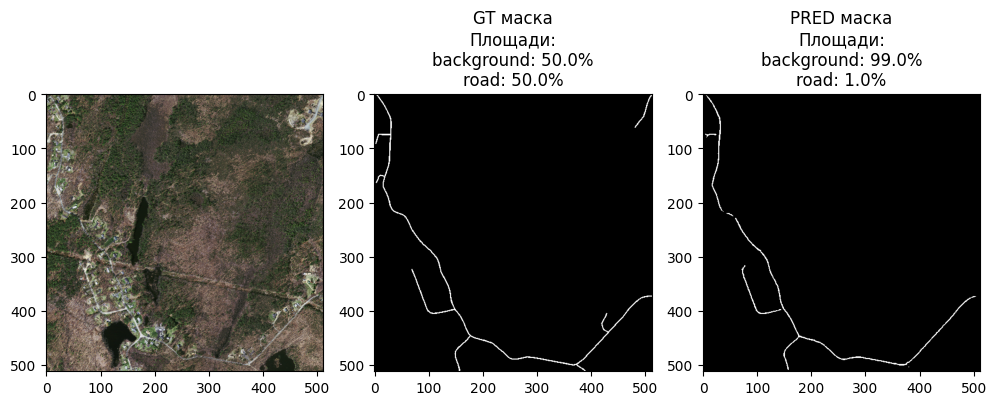

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


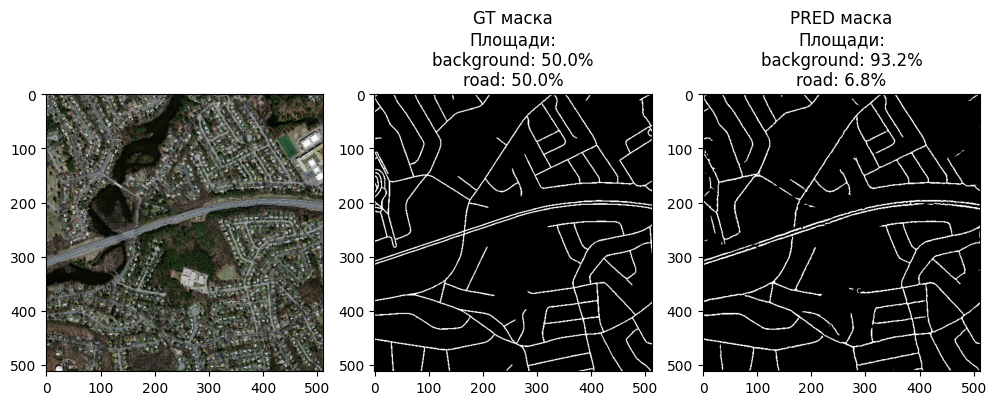

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


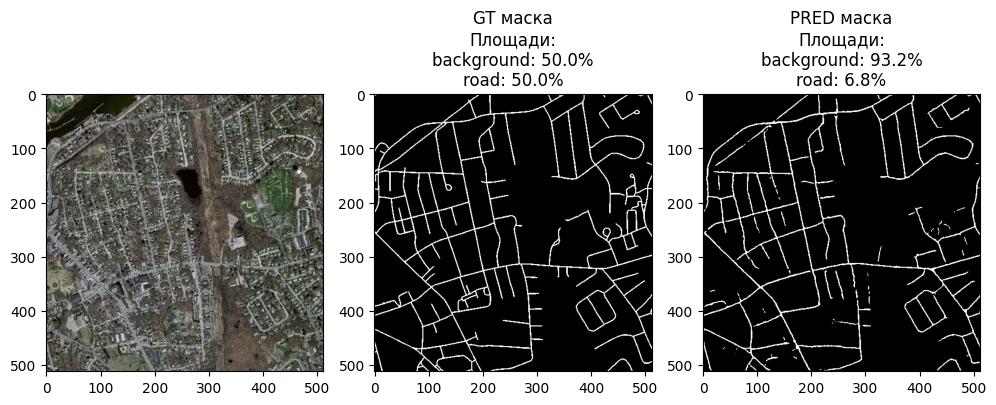

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


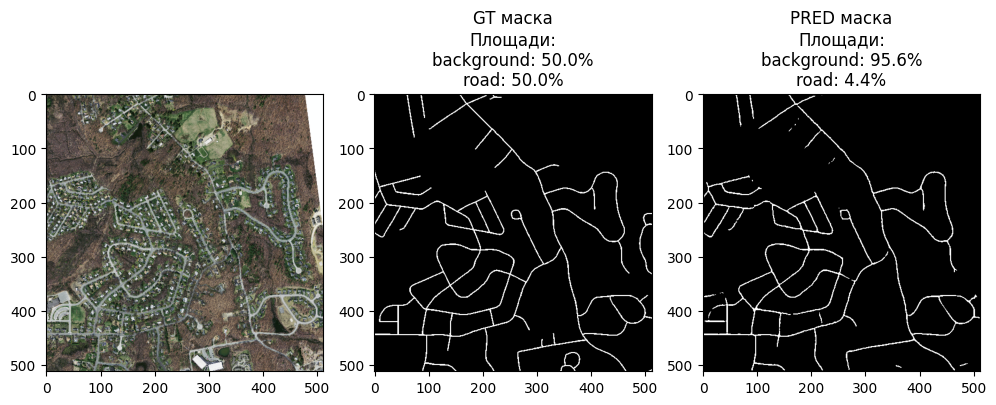

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


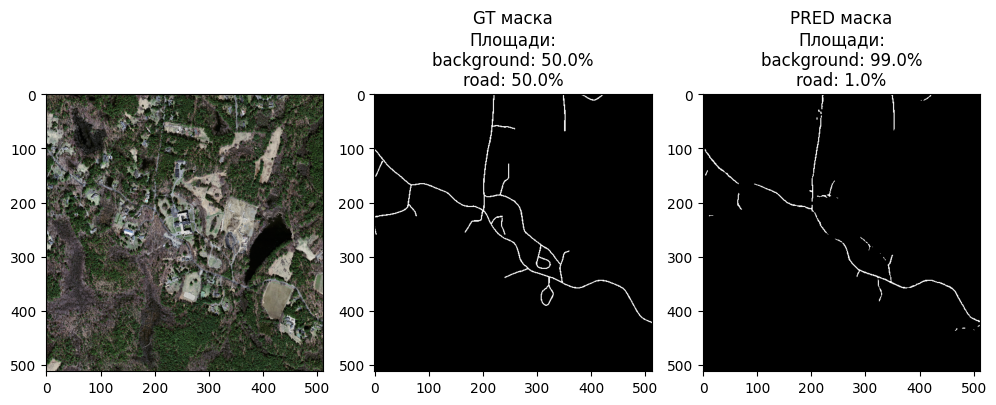

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


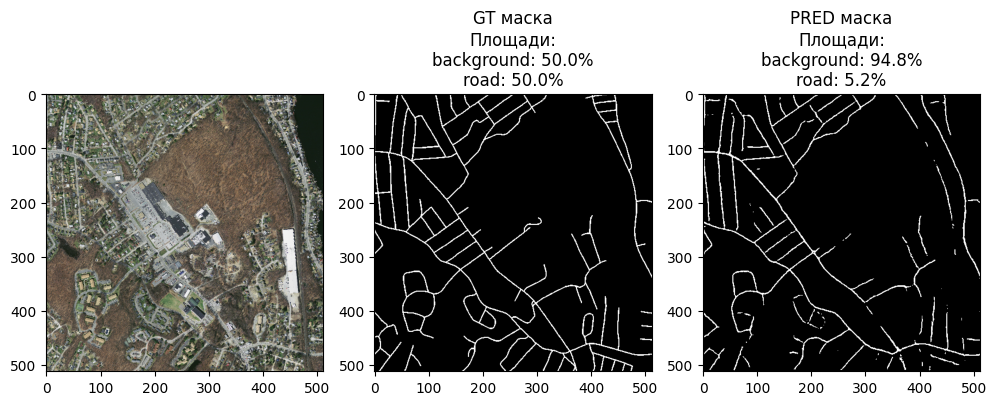

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


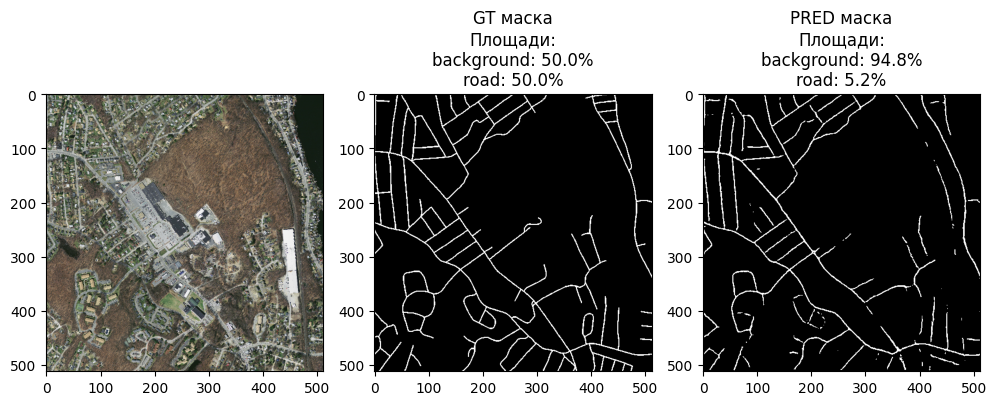

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


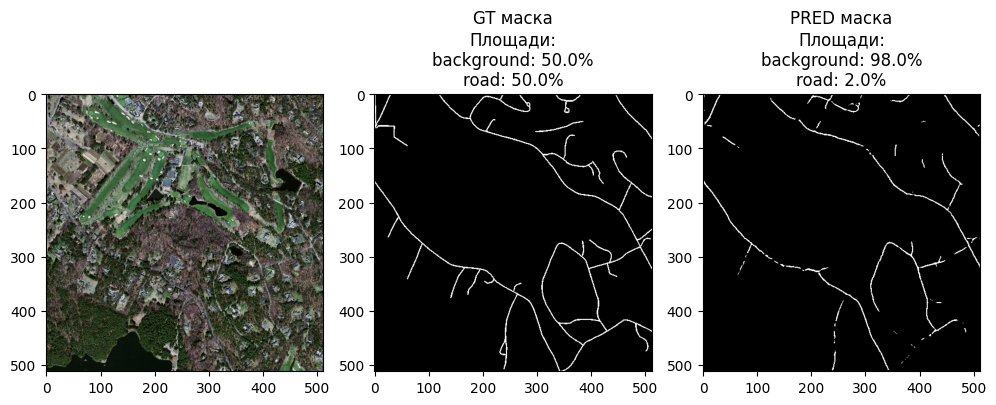

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


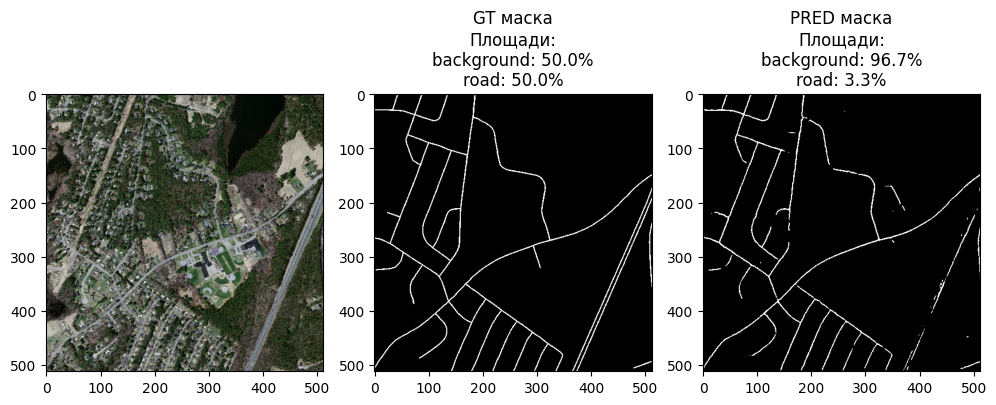

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


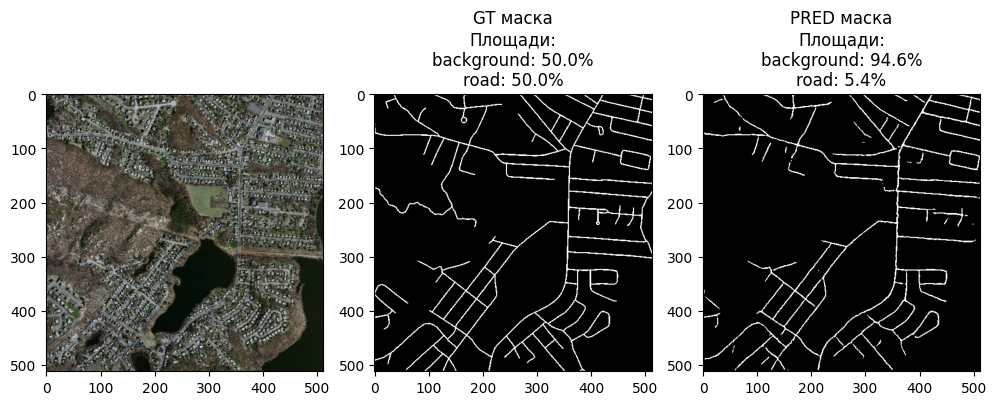

In [25]:
for i in range(10):
    n = np.random.choice(len(test_dataset))
    
    image, gt_mask = test_dataset[n]
    gt_mask = gt_mask.squeeze()
    
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = best_model(x_tensor)

    pr_mask = pr_mask.squeeze().cpu().detach().numpy()
    #print(f"max pred mask: {max(pr_mask)}, min pred mask: {min(pr_mask)}")
    
    label_mask = np.argmax(pr_mask, axis=0)
    print(type(label_mask))
    
    print(label_mask.shape, image.shape, gt_mask.shape)

    visualize_predicts(image, gt_mask, label_mask, normalized=True)

### Применим морфологические операции к результату

In [26]:
import cv2
import numpy as np

def postprocess_mask(pred_mask, kernel_size=3):
    """
    Применяет морфологическую операцию к предсказанной маске.
    
    Аргументы:
        pred_mask: np.ndarray (H, W), бинарная маска (0 и 1)
        kernel_size: int, размер ядра для морфологии

    Возвращает:
        postprocessed_mask: np.ndarray (H, W)
    """
    # Убедись, что маска бинарная
    binary_mask = (pred_mask > 0.5).astype(np.uint8) * 255  # → [0, 255]
    
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    
    # Убираем шум
    opened = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)

    # Соединяем разрывы
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel)

    return (closed > 127).astype(np.uint8)


<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


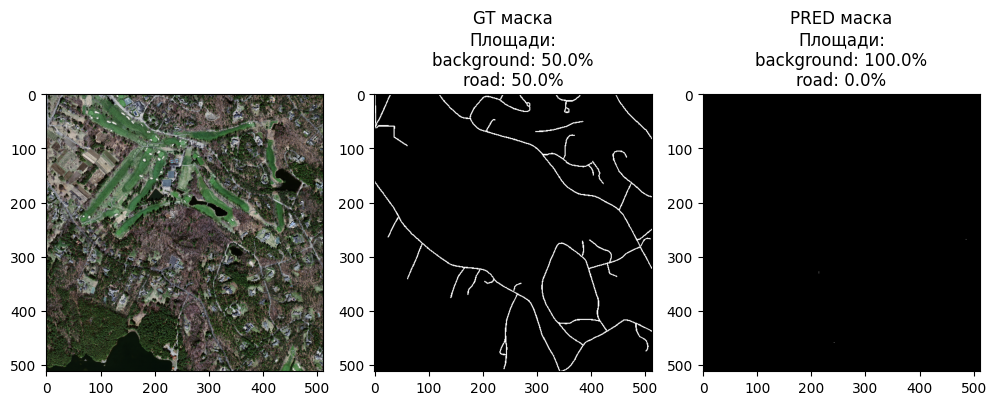

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


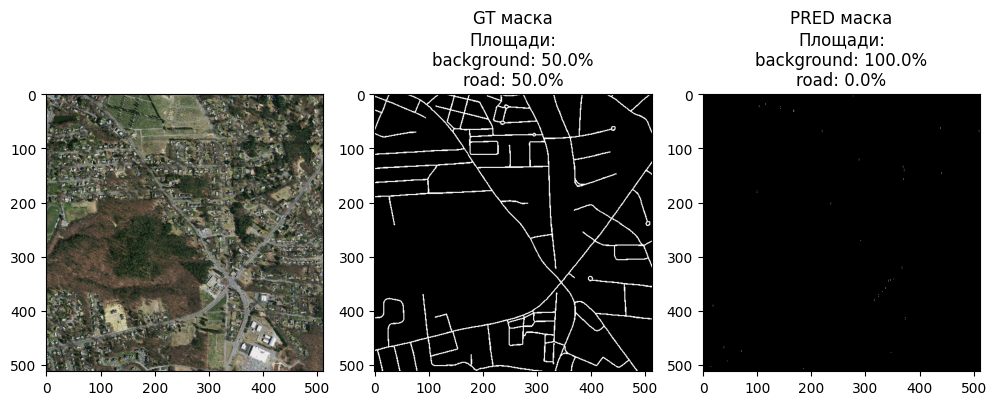

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


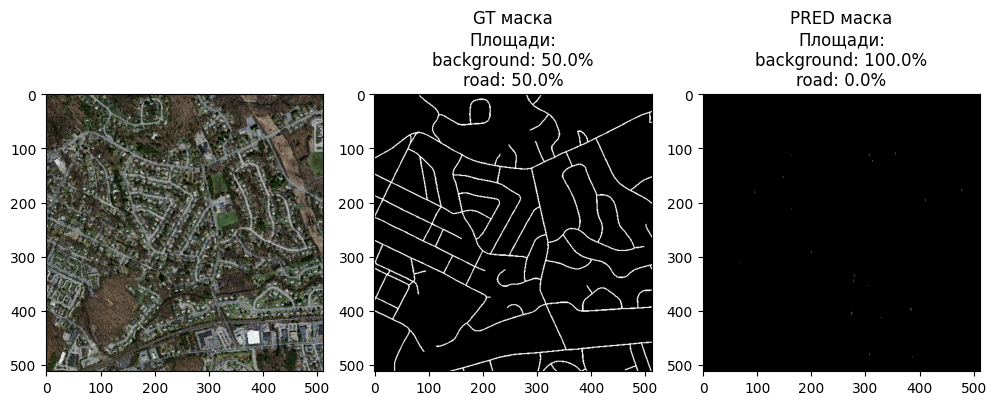

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


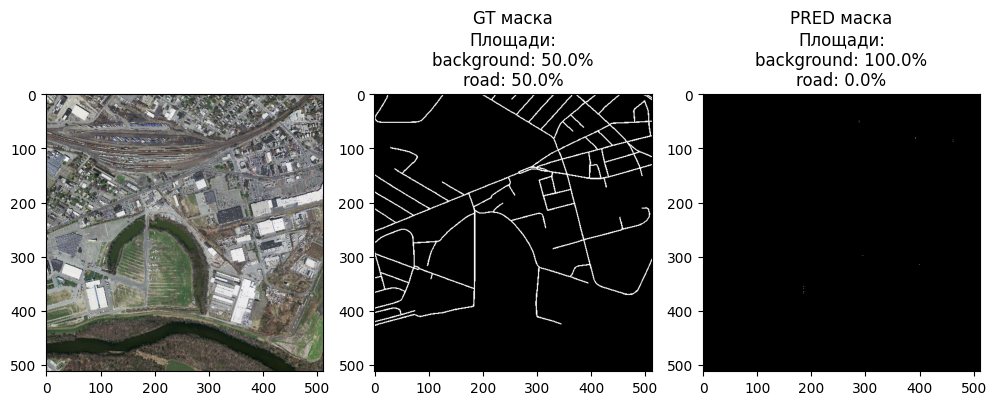

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


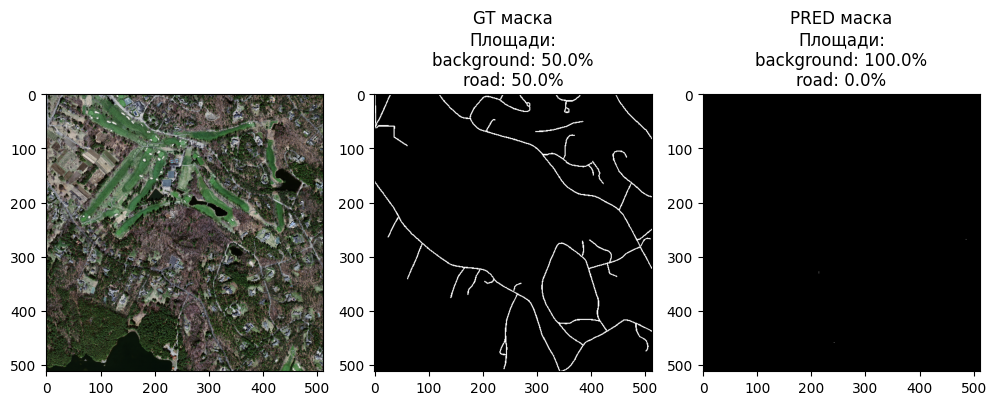

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


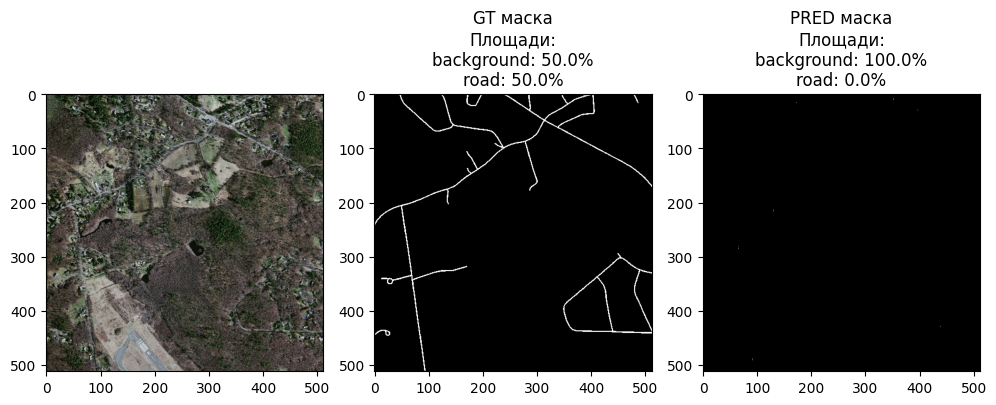

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


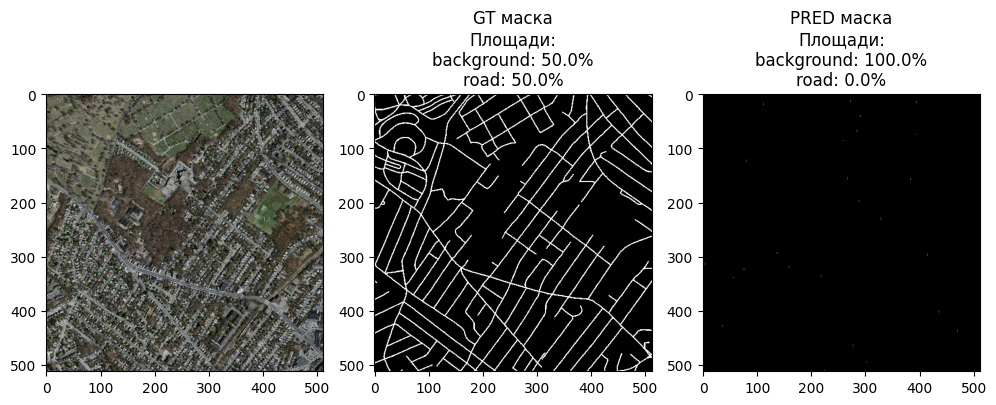

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


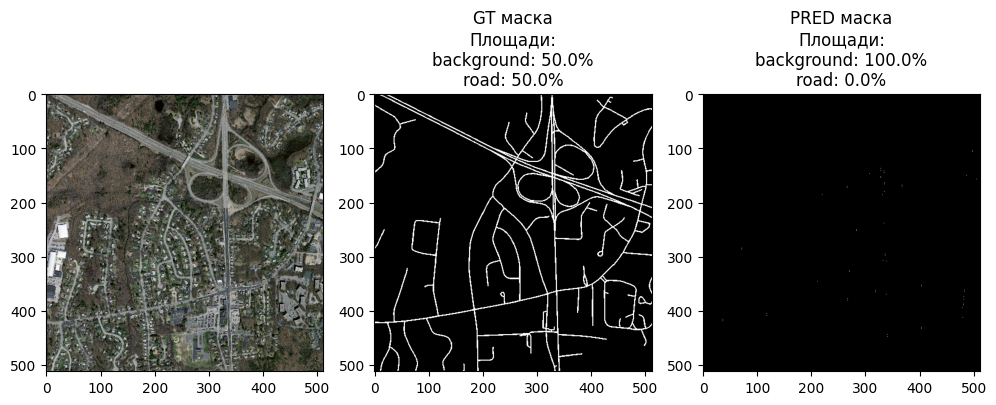

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


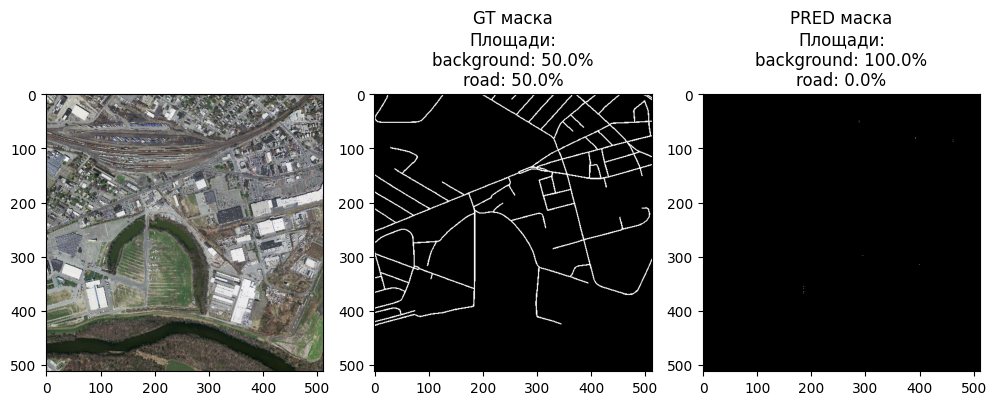

<class 'numpy.ndarray'>
(512, 512) (3, 512, 512) (2, 512, 512)
(512, 512, 3)
(2, 512, 512, 3)


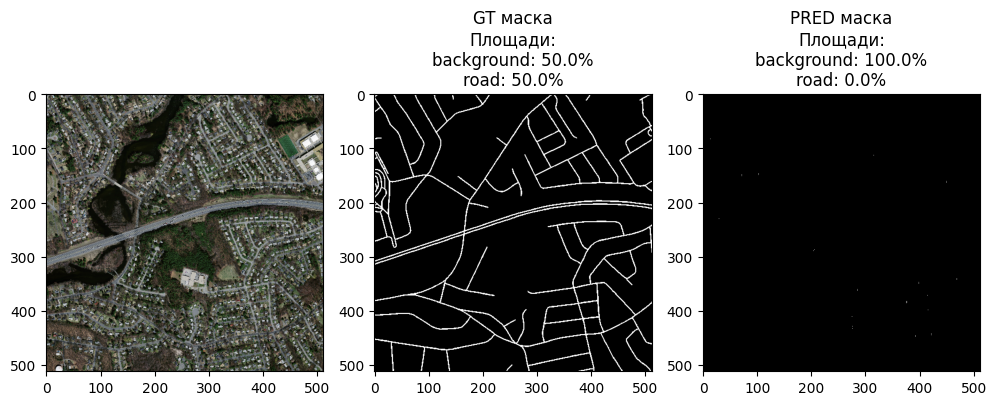

In [27]:
for i in range(10):
    n = np.random.choice(len(test_dataset))
    
    image, gt_mask = test_dataset[n]
    gt_mask = gt_mask.squeeze()
    
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = best_model(x_tensor)

    pr_mask = pr_mask.squeeze().cpu().detach().numpy()
    pr_mask = postprocess_mask(pr_mask)
    
    label_mask = np.argmax(pr_mask, axis=0)
    print(type(label_mask))
    
    print(label_mask.shape, image.shape, gt_mask.shape)

    visualize_predicts(image, gt_mask, label_mask, normalized=True)